# **Proyecto de análisis de precios de AirBnb para un cliente de Madrid**

En este proyecto aplicaremos habilidades de análisis y visualización de datos para un proyecto ficticio. Nuestro cliente posee apartamentos de distintos tipos y características repartidos por todo Madrid. Los alquila mediante la famosa plataforma Airbnb y quiere nuestra ayuda como analistas para que le aconsejemos sobre cómo optimizar el precio. 

Nos ha proporcionado diversos datasets con información que puede ser relevante para nuestra tarea.

# 0. Data

Para realizar este proyecto contamos con el siguiente set de datos:

| Fichero                          | Descripción                                                                 |
|----------------------------------|-----------------------------------------------------------------------------|
| airbnb_madrid_host.parquet       | Información del propietario de cada vivienda.                               |
| airbnb_madrid_location.parquet   | Información de la localización de cada vivienda.                            |
| airbnb_madrid_property.parquet   | Información de la vivienda.                                                 |
| airbnb_madrid_conditions.parquet | Información de las condiciones de cada vivienda para poder alquilarla.      |
| airbnb_madrid_reviews.parquet    | Información de las reseñas de cada vivienda.                                |

In [3]:
#importamos librerías

import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

#cargamos los datasets

data_folder = '/Users/Alis/Desktop/PORTFOLIO/AirBnb/DATA_airbnb/'


df_host = pd.read_parquet(data_folder+'airbnb_madrid_host.parquet')
df_location = pd.read_parquet(data_folder+'airbnb_madrid_location.parquet')
df_property = pd.read_parquet(data_folder+'airbnb_madrid_property.parquet')
df_conditions = pd.read_parquet(data_folder+'airbnb_madrid_conditions.parquet')
df_reviews = pd.read_parquet(data_folder+'airbnb_madrid_reviews.parquet')


#unimos los datos para tener un único dataset

df = pd.merge(df_host, df_location, on='id', how='inner')
df= pd.merge(df,df_property,on='id', how='inner')
df= pd.merge(df,df_conditions,on='id', how='inner')
df= pd.merge(df,df_reviews,on='id', how='inner')

In [4]:
#creamos los datasets a partir del original que nos servirán para el análisis posterior
df_apartments = df[df['property_type']=='apartment']
df_apartments = df_apartments.set_index('id')
df_apartments_mod = df_apartments[df_apartments['price']<200]#dataset de apartamentos que tienen un precio por debajo de 200 eur noche
df_apartments_out = df_apartments[df_apartments['price']>=200] #dataset de apartamentos que tienen un precio superior a 200 eur noche (de lujo, outliers...)

# 1. Elaborar un contexto del problema

Ojeamos los datos, nos familiarizamos con ellos. Observamos que la variable de estudio es muy dispersa, es decir, contiene valores extremos muy distantes. Eso nos indica que quizás será interesante trabajar por separado los datos, diferenciando entre aquellos apartamentos más cercanos a los precios normales y los que estén muy por encima.

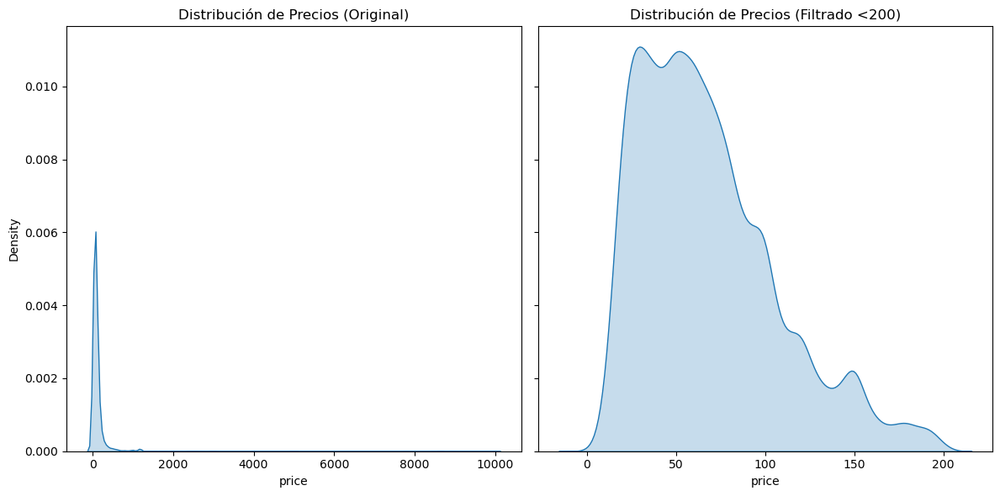

In [5]:
# Configurar el tamaño del lienzo y los subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

# Gráfico de densidad para el dataset original
sns.kdeplot(df_apartments['price'],fill=True, ax=axs[0])
axs[0].set_title('Distribución de Precios (Original)')

# Gráfico de densidad para el dataset filtrado por precios inferiores a 200
sns.kdeplot(df_apartments_mod['price'],fill=True, ax=axs[1])
axs[1].set_title('Distribución de Precios (Filtrado <200)')

# Ajustar espaciado entre subplots
plt.tight_layout()

# Mostrar el lienzo
plt.show()


<div style="text-align:center; color:; font-size:larger; font-weight:bold; border: 2px red; padding: 10px;">
    (1) ¿Qué insights sacamos de estos gráficos?
</div>

La distribución de precios original muestra que el precio puede tomar valores muy bajos y otros muy altos (hasta 1000 euros la noche). Analizar los datos sin realizar un criterio de filtrado podría dificultar la extracción de conclusiones.
Por ello, para la mayor parte del trabajo vamos a trabajar con los datos filtrados para apartamentos con precios inferiores a 200 euros la noche. Posteriormente, realizaremos un análisis también de los apartamentos con precios superiores a esa cifra, para dar una visión más completa a nuestro cliente. 

# 2. Definir el problema que queremos resolver

Después de realizar unas primeras estadísticas como toma de contacto de los datos y de hablar con el cliente para entender mejor sus necesidades, podemos definir mejor el problema a resolver:
- **concreto**: ¿Qué variables pueden tener un efecto sobre el precio por noche de los apartamentos de Madrid en Airbnb suba o baje? 

- **alcance**: Los datos analizados son del año 2018. El cliente es consciente de ello, entiende el sesgo de establecer comparativas entre 2018 y 2024. Por lo tanto, el análisis acabará cuando hayamos contrastado las hipótesis del Roadmap ya que no hay datos de años posteriores. Nos centraremos en analizar cómo las distintas variables afectan al precio de los apartamentos que sea inferior a 200 euros noche (total de 15485 apartamentos, un 90,1% del total de pisos). Posteriormente, según nuestros resultados haremos una segunda tanda de hipótesis más complejas, y en esta fase analizaremos tanto el grupo de precios normal como el de outliers. 

- **valor**: La solución del problema tiene valor para nuestro cliente, ya que este estudio le permitirá saber de qué puede depender el precio por noche. 

- **accionable**: El cliente afirma tener poder de acción en base a los resultados que obtengamos. Nos avisa de que a corto plazo sus acciones son más limitadas, ya que dependen de la limitación de algunos de sus apartamentos. Por ello, decidimos que comunicaremos los insights de dos maneras: acciones a corto plazo (como por ejemplo, añadir una cama más o una TV) y acciones a medio y largo plazo (realizar una reforma o invertir en determinadas zonas)


# 3. Definir y desarrollar el Roadmap del analisis

## 3.1 Primer grupo de hipótesis: independientes por grupos

- ``hipótesis 1``: el precio por noche de un apartamento depende de las características del anfritrión
    - question 1.1: de si es considerado un súper anfitrión o no: host_is_superhost
    - question 1.2: de si cumple con las distintas verificaciones (menos de la mitad o más de la mitad)
    - question 1.3: del número de propiedades que tiene
    
- ``hipótesis 2``: el precio por noche de un apartamento depende de la localización
    - question 2.1: de si está en un barrio u otro
    - question 2.2: de si está en una zona u otra
    - question 2.3: de la distancia a la que se encuentra de la Puerta del Sol
    - question 2.4: de la distancia a la que se encuentra del aeropuerto

- ``hipótesis 3``: el precio por noche de un apartamento depende de las características de la propiedad.
   - question 3.1: de la cantidad de huéspedes a alojar
   - question 3.2: de la modalidad de alquiler (apartamento completo, habitación privada o habitación compartida)
   - question 3.3: del número de baños
   - question 3.4: del número de camas
   - question 3.5: de la tipología de las camas
   - question 3.6: de las comodidades que tengan 
            - TV
            - WI-FI
            - Calefacción
            - Cocina
            - Aire acondicionado

- ``hipótesis 4``: el precio por noche de un apartamento depende de las condiciones del contrato
    - question 4.1: del número mínimo de noches
    - question 4.2: del número máximo de noches
    - question 4.3: de la política de cancelación


- ``hipótesis 5``: el precio por noche de un apartamento depende de las puntuaciones recibidas en las reseñas. Decicimos analizar sólo esta variable ya que consideramos que es un buen resumen del resto y nuestro cliente no tiene un poder directo sobre las reviews. Consideramos que pueden tener efectos sobre la fijación de precios, pero por el motivo anterior no nos centraremos de manera muy exhaustiva en ellas. 
    - question 5.1: del rating de las puntuaciones de las reseñas

## Hipótesis 1: características del anfitrión

### question 1.1 - host_is_superhost

In [6]:
# Crear boxplots con Plotly
fig = px.box(df_apartments_mod, x='host_is_superhost', y='price',
             title='Distribución de precios por grupo de huéspedes y superhost',
             color ='host_is_superhost')
fig.update_layout(showlegend=True) 



fig.show()

### question 1.2 - verifications 

Hemos creado dos grupos en nuestro dataset. Perfiles de anfitriones con más de la mitad de verificaciones vs anfitriones con perfiles menos verificados

In [7]:
#creamos una nueva columna en nuestro dataframe para aplicar el filtro por verificaciones
df_apartments_mod['total_host_verifications'] = df_apartments_mod[['host_verifications_email', 'host_verifications_phone', 
                                 'host_verifications_reviews', 'host_verifications_facebook',
                                 'host_verifications_government_id', 'host_identity_verified','host_has_profile_pic' ]].sum(axis=1)
df_apartments_mod['enough_verifications'] = df_apartments_mod['total_host_verifications']>=3
df_apartments_mod['not_enough_verifications'] = df_apartments_mod['total_host_verifications']< 3
#ahora aplicamos el código
fig = px.box(df_apartments_mod, x='enough_verifications', y='price', 
             category_orders={'enough_verifications': [True, False]},
             title='Distribución del precio por verificaciones suficientes y no suficientes',
             color ='enough_verifications')
fig.update_layout(xaxis_title='Verificaciones suficientes', yaxis_title='Precio por huésped') 
fig.show()

### question 1.3 - calculated_host_listings_count

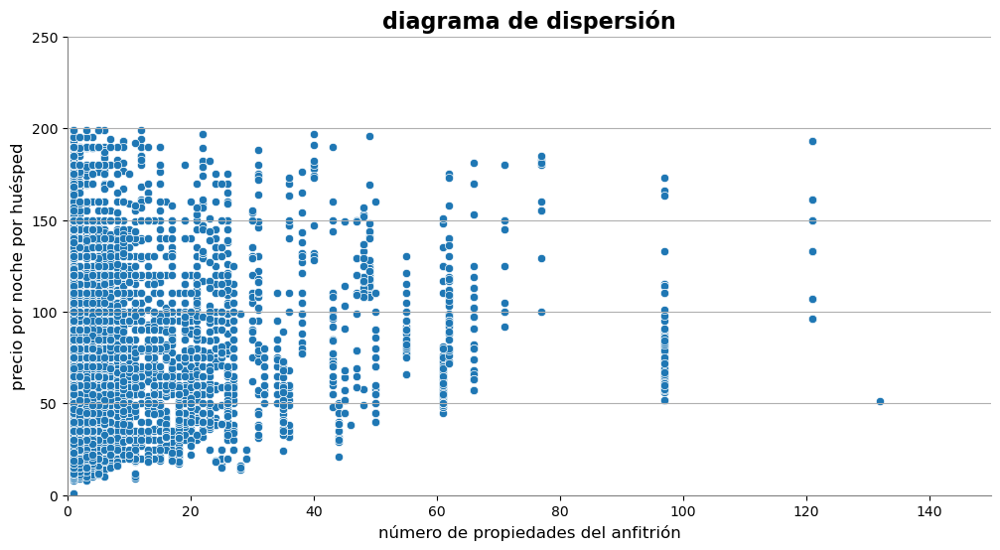

In [8]:
#usamos un scatterplot
plt.figure(figsize=(12, 6))
# scaterplot ventas vs ventas lag1
ax = sns.scatterplot(
    data=df_apartments_mod,
    x='calculated_host_listings_count',
    y="price",
    legend=False,
)
# añadir título al plot y a los ejes
ax.set_title("diagrama de dispersión", fontsize=16, fontweight="bold")
ax.set_xlabel("número de propiedades del anfitrión", fontsize=12)
ax.set_ylabel("precio por noche por huésped", fontsize=12)
# personalizar el grid de fondo
ax.grid(alpha=1, drawstyle="steps", axis="y", linestyle="-")
# personalizar el marco del plot
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("gray")
ax.spines["bottom"].set_color("gray")
# Ajusta los límites de los ejes x e y
plt.xlim(0, 150)
plt.ylim(0, 250)

# show plot
plt.show()

In [9]:
df_spearman = (
    df_apartments_mod[['calculated_host_listings_count', 'price']]
    .sort_values(by="calculated_host_listings_count")  # Ordenar por el número de propiedades
    .assign(x_index=range(len(df_apartments_mod)))  # Asignar índices a la columna x
    .sort_values(by="price")  # Ordenar por el precio por noche
    .assign(y_index=range(len(df_apartments_mod)))  # Asignar índices a la columna y
    .assign(
        diff_=lambda x: (x.x_index - x.y_index),  # Calcular la diferencia entre los índices
        diff_2=lambda x: x.diff_**2,  # Elevar al cuadrado la diferencia
        )
)
n = len(df_spearman)
corr = 1 - 6*df_spearman.diff_2.sum() / (n*(n**2 - 1))  # Calcular la correlación de Spearman
print(f"Correlación de Spearman entre el número de propiedades del anfitrión y el precio por noche: {corr}")
df_spearman

Correlación de Spearman entre el número de propiedades del anfitrión y el precio por noche: 0.13844327942611523


,calculated_host_listings_count,price,x_index,y_index,diff_,diff_2
id,,,,,,
18260,1,1.0,1858,0,1858,3452164
5971,1,8.0,1275,1,1274,1623076
7312,3,8.0,9375,2,9373,87853129
17886,1,9.0,1614,3,1611,2595321
5946,2,9.0,7767,4,7763,60264169
...,...,...,...,...,...,...
14337,1,199.0,2554,15480,-12926,167081476
16340,3,199.0,9784,15481,-5697,32455809
9566,1,199.0,3504,15482,-11978,143472484



## Insights Anfitrión:
- Ser un superhost tiene efectos en el precio. El 50% de la muestra de apartamentos que no cuentan con la etiqueta de superhost pueden fijar un precio de 60 la noche, mientras que los superhost de 68. Esa diferencia multiplicada por un número de noches alto puede marcar diferencia. Sería interesante que el cliente cumpliera entonces con las características necesarias para ser superhost. 

- Parece ser que tener más o menos verificaciones en el perfil del host no es un factor determinante para la fijación de precios.

- Aunque a medida que el anfitrión tiene más viviendas vemos cómo el precio va subiendo, nuestra muestra se centra en anfitriones que tienen sólo 1 vivienda. Por lo tanto, aunque la correlación tenga una tendencia positiva (a más apartamentos, precio mayor) no es lo suficientemente significativa para nuestro estudio.



## Hipótesis 2: localización

 ### question 2.1: barrio

   

In [10]:
fig = px.box(df_apartments_mod, x='neighbourhood', y='price', 
             title='Distribución de precios por noche por barrio',
             labels={'price': 'Precio por noche', 'neighbourhood': 'Barrio'})
            

fig.show()

 ### question 2.2: zona

In [11]:
fig = px.box(df_apartments_mod, x='neighbourhood_group', y='price', 
             title='Distribución de precios por noche por grupos de barrios',
             labels={'price': 'Precio por noche', 'neighbourhood_group': 'Grupos de barrio'})
            

fig.show()

In [12]:
#Aquí visualizamos el precio mediano para cada zona de barrios, en orden, y establecemos una división de las zonas en grupos. 
#La primera corresponde a las zonas más caras, la segunda a las zonas medias y la última a las zonas más baratas

median_price = df_apartments_mod.groupby('neighbourhood_group')['price'].median()
# Crear un DataFrame a partir de la serie median_price
df_median_price = pd.DataFrame({'Neighbourhood Group': median_price.index, 'Price Median': median_price.values})

# Ordenar el DataFrame por el valor de la mediana en orden descendente
df_sorted = df_median_price.sort_values(by='Price Median', ascending=True)

# Graficar el DataFrame ordenado
fig = px.bar(df_sorted, x='Price Median', y='Neighbourhood Group', orientation='h')
fig.update_layout(title='Mediana de precios por grupo de barrio',
                  xaxis_title='Precio',
                  yaxis_title='Grupo de barrio',)
                 
# Definir los índices de las zonas para colocar las líneas horizontales
indices_zonas = [6, 15]  # Reemplazar con los índices específicos que has identificado

# Agregar líneas horizontales en las posiciones especificadas
for indice in indices_zonas:
    fig.add_hline(y=indice, line_dash='dash')
fig.show()


 ### question 2.3: distancia km puerta Sol

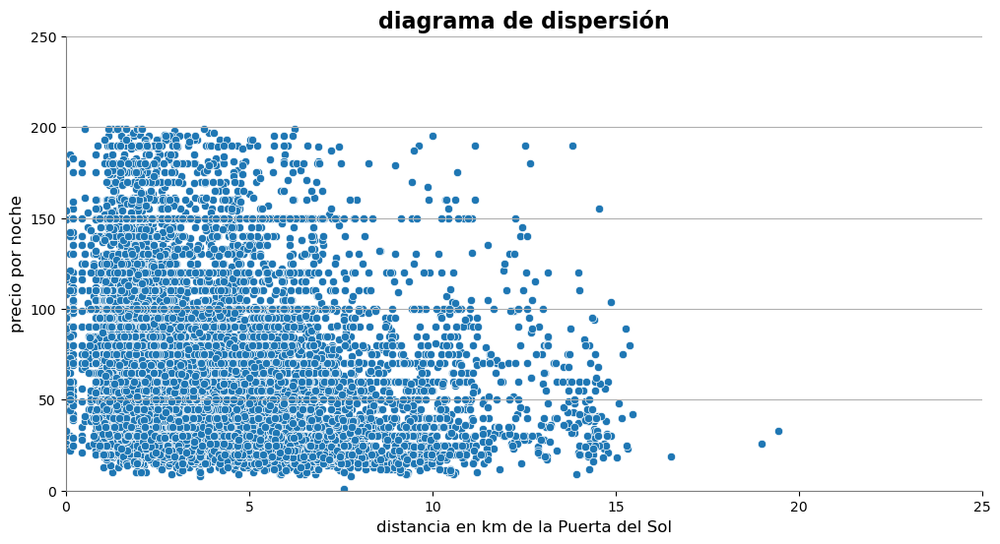

Correlación de Spearman entre la distancia en km a la Puerta del Sol y el precio por noche: -0.26142841272568296


,dist_km_sol,price,x_index,y_index,diff_,diff_2
id,,,,,,
18260,7.587943,1.0,14311,0,14311,204804721
7312,3.653062,8.0,9917,1,9916,98327056
5971,7.777629,8.0,14396,2,14394,207187236
13734,9.274318,9.0,14804,3,14801,219069601
17886,4.703995,9.0,11389,4,11385,129618225
...,...,...,...,...,...,...
9566,1.950257,199.0,4238,15480,-11242,126382564
8795,1.527444,199.0,1924,15481,-13557,183792249
8482,0.525743,199.0,177,15482,-15305,234243025


In [13]:
#usamos un scatterplot
plt.figure(figsize=(12, 6))
# scaterplot ventas vs ventas lag1
ax = sns.scatterplot(
    data=df_apartments_mod,
    x='dist_km_sol',
    y="price",
    legend=False,
)
# añadir título al plot y a los ejes
ax.set_title("diagrama de dispersión", fontsize=16, fontweight="bold")
ax.set_xlabel("distancia en km de la Puerta del Sol", fontsize=12)
ax.set_ylabel("precio por noche", fontsize=12)
# personalizar el grid de fondo
ax.grid(alpha=1, drawstyle="steps", axis="y", linestyle="-")
# personalizar el marco del plot
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("gray")
ax.spines["bottom"].set_color("gray")
# Ajusta los límites de los ejes x e y
plt.xlim(0, 25)
plt.ylim(0, 250)

# show plot
plt.show()

df_spearman_sol = (
    df_apartments_mod[['dist_km_sol', 'price']]
    .sort_values(by="dist_km_sol")  # Ordenar por la distancia en km de Sol
    .assign(x_index=range(len(df_apartments_mod)))  # Asignar índices a la columna x
    .sort_values(by="price")  # Ordenar por el precio por noche
    .assign(y_index=range(len(df_apartments_mod)))  # Asignar índices a la columna y
    .assign(
        diff_=lambda x: (x.x_index - x.y_index),  # Calcular la diferencia entre los índices
        diff_2=lambda x: x.diff_**2,  # Elevar al cuadrado la diferencia
        )
)
n = len(df_spearman_sol)
corr = 1 - 6*df_spearman_sol.diff_2.sum() / (n*(n**2 - 1))  # Calcular la correlación de Spearman
print(f"Correlación de Spearman entre la distancia en km a la Puerta del Sol y el precio por noche: {corr}")
df_spearman_sol

### question 2.4: distancia km Aeropuerto

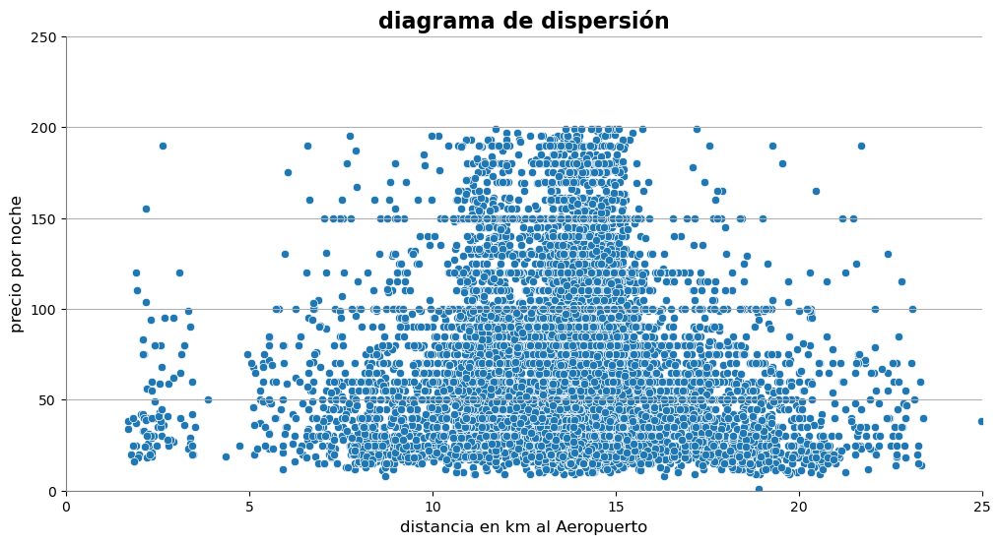

Correlación de Spearman entre la distancia en km al Aeropuerto y el precio por noche: -0.07299639140641379


,dist_km_airport,price,x_index,y_index,diff_,diff_2
id,,,,,,
18260,18.892597,1.0,15047,0,15047,226412209
5971,8.699985,8.0,506,1,505,255025
7312,16.313731,8.0,14125,2,14123,199459129
9232,19.738594,9.0,15219,3,15216,231526656
13734,18.820167,9.0,15030,4,15026,225780676
...,...,...,...,...,...,...
16340,11.710483,199.0,2118,15480,-13362,178543044
8482,14.528270,199.0,9993,15481,-5488,30118144
19217,13.638752,199.0,5490,15482,-9992,99840064


In [14]:
#usamos un scatterplot
plt.figure(figsize=(12, 6))
# scaterplot ventas vs ventas lag1
ax = sns.scatterplot(
    data=df_apartments_mod,
    x='dist_km_airport',
    y="price",
    legend=False,
)
# añadir título al plot y a los ejes
ax.set_title("diagrama de dispersión", fontsize=16, fontweight="bold")
ax.set_xlabel("distancia en km al Aeropuerto", fontsize=12)
ax.set_ylabel("precio por noche", fontsize=12)
# personalizar el grid de fondo
ax.grid(alpha=1, drawstyle="steps", axis="y", linestyle="-")
# personalizar el marco del plot
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("gray")
ax.spines["bottom"].set_color("gray")
# Ajusta los límites de los ejes x e y
plt.xlim(0, 25)
plt.ylim(0, 250)

# show plot
plt.show()
df_spearman_airport = (
    df_apartments_mod[['dist_km_airport', 'price']]
    .sort_values(by="dist_km_airport")  # Ordenar por la distancia en km de Sol
    .assign(x_index=range(len(df_apartments_mod)))  # Asignar índices a la columna x
    .sort_values(by="price")  # Ordenar por el precio por noche
    .assign(y_index=range(len(df_apartments_mod)))  # Asignar índices a la columna y
    .assign(
        diff_=lambda x: (x.x_index - x.y_index),  # Calcular la diferencia entre los índices
        diff_2=lambda x: x.diff_**2,  # Elevar al cuadrado la diferencia
        )
)
n = len(df_spearman_airport)
corr = 1 - 6*df_spearman_airport.diff_2.sum() / (n*(n**2 - 1))  # Calcular la correlación de Spearman
print(f"Correlación de Spearman entre la distancia en km al Aeropuerto y el precio por noche: {corr}")
df_spearman_airport




## Insights Localización:

- La localización es un factor determinante a la hora de fijar los precios. 
- Barrios: hay una relación altísima, depende mucho del barrio. Los precios se comportan de manera distinta. Como visualmente puede ser complicado, nos centramos en analizar el precio por zonas.
- Zonas: hay 21 zonas en nuestro dataset que se distribuyen en:
     + Caras: Centro, Chamartín, Salamanca, Moncloa-Aravaca, Retiro, Chamberí. En estas los precios más altos de la muestra pueden rondar entre 197 y 170 euros la noche. Para estas zonas, los valores centrales se distribuyen entre los 59 y 70 euros la noche. 
     + Medias : Hortaleza, Arganzuela, Fuencarral-El Pardo, Latina, Ciudad Lineal, San Blas-Canillejas, Carabanchel, Tetuán, Barajas. Aquí hablamos de valores máximos de 120 a 165 euros,y de valores centrales de entre 38 y 55 euros la noche. 
    + Baratas: Villaverde, Vicálvaro, Villa de Vallecas, Moratalaz, Usera, Puente de Vallecas. Zonas con máximos de 90 a 104 euros, y de valores centrales entre 25 y 32.
- Respecto a las distancias, los km que hay entre la vivienda y la puerta del Sol muestran una correlación negativa con el precio de -0,26 (a más distancia, menor precio), pero al no ser muy cercana a -1 no la consideraremos para futuros análisis. Es evidente qu existe, pero creemos que las zonas son más influyentes en este aspecto. La distancia en km al aeropuerto muestra una correlación negativa todavía menor, de -0,07. 


## Hipótesis 3: características de la propiedad




### question 3.1: cantidad huéspedes máxima

In [15]:
#agrupamos los pisos por números máximo de huéspedes
bins = [1,2,3,4,6,7, float('inf')]  # Definir los límites de los rangos
labels = ['1','2','3', '4', '5-6','+7']  # Etiquetas para los rangos
df_apartments_mod['accommodates_group'] = pd.cut(df_apartments_mod['accommodates'], bins=bins, labels=labels)
counts_accommodates = df_apartments_mod['accommodates_group'].value_counts()

paleta_colores_discreta = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]
fig = px.box(df_apartments_mod, x='accommodates_group', y='price', 
             title='Distribución de precios por noche y número máximo de huéspedes',
             labels={'price': 'Precio por noche', 'accommodates_group': 'Número máximo de huéspedes'},
             color_discrete_sequence=paleta_colores_discreta)

fig.update_layout(showlegend=False)
fig.show()

### question 3.2: modalidad del alquiler

In [16]:
fig = px.box(df_apartments_mod, x='room_type', y='price', 
             color='room_type',
             title='Distribución de precios por noche y modalidad de alquiler',
             labels={'price': 'Precio por noche', 'room_type': 'Modalidad de alquiler'})
fig.update_layout(showlegend=False)
fig.show()

### question 3.3: número de baños

In [17]:
#agrupamos los pisos por números de baños
bins = [0,1, 2, 3, 4, float('inf')]  # Definir los límites de los rangos
labels = ['<1','1','2', '3', '4+']  # Etiquetas para los rangos
df_apartments_mod['bathrooms_group'] = pd.cut(df_apartments_mod['bathrooms'], bins=bins, labels=labels)
counts_bathrooms = df_apartments_mod['bathrooms_group'].value_counts()


fig = px.box(df_apartments_mod, x='bathrooms_group', y='price', 
             color='bathrooms_group',
             title='Distribución de precios por noche y número de baños',
             labels={'price': 'Precio por noche', 'bathrooms_group': 'Baños'})
fig.update_layout(showlegend=False)
fig.show()

### question 3.4: número de camas

In [18]:
#igual que con los baños, hacemos agrupación para facilitar el análisis
#agrupamos los pisos por números de camas
bins = [1, 2, 3, 5, +6, float('inf')]  # Definir los límites de los rangos
labels = ['1','2','3', '4-5', '6+']  # Etiquetas para los rangos
df_apartments_mod['beds_group'] = pd.cut(df_apartments_mod['beds'], bins=bins, labels=labels)
counts_beds = df_apartments_mod['beds_group'].value_counts()

# Ahora df_apartments contiene una nueva columna 'beds_group' que clasifica cada apartamento en función de cuántas camas tiene
fig = px.box(df_apartments_mod, x='beds_group', y='price', 
             color='beds_group',
             title='Distribución de precios por noche y número de camas',
             labels={'price': 'Precio por noche', 'beds_group': 'Camas'})
fig.update_layout(showlegend=False)

fig.show()

### question 3.5: tipología de camas

In [19]:
df_apartments_mod.bed_type.value_counts(normalize=True)

bed_type
real_bed         0.991540
pull_out_sofa    0.007104
futon            0.000904
couch            0.000323
airbed           0.000129
Name: proportion, dtype: float64

In [20]:
# Obtener el conteo de cada tipo de cama
conteo_camas = df_apartments_mod['bed_type'].value_counts(normalize=True)

fig = px.box(df_apartments_mod, x='bed_type', y='price', 
             color='bed_type',
             title='Distribución de precios por noche y tipo de cama',
             labels={'price': 'Precio por noche', 'bed_type': 'Tipo de cama'},
             hover_data={'bed_type': True, 'price': False})

fig.update_layout(showlegend=False)
fig.show()



### question 3.6: comodidades
 - TV
 - WI-FI
 - Calefacción
 - Cocina
 - Aire acondicionado

In [22]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=1, cols=5, subplot_titles=('TV', 'Aire Acondicionado', 'Calefacción', 'Cocina', 'WiFi'))
color_con_amenity = 'blue'
color_sin_amenity = 'red'
# Graficar cada comodidad
for i, amenity in enumerate(['amenities_tv', 'amenities_air_conditioning', 'amenities_heating', 'amenities_kitchen', 'amenities_wifi_internet']):
    # Propiedades con la amenity
    subplot_with_amenity = px.box(df_apartments_mod[df_apartments_mod[amenity] == 1], x=amenity, y='price', color_discrete_sequence=[color_con_amenity])
    # Propiedades sin la amenity
    # Propiedades sin la amenity
    subplot_without_amenity = px.box(df_apartments_mod[df_apartments_mod[amenity] == 0], x=amenity, y='price', color_discrete_sequence=[color_sin_amenity])
    
    # Agregar gráficos al subplot
    fig.add_trace(subplot_with_amenity['data'][0], row=1, col=i+1)
    fig.add_trace(subplot_without_amenity['data'][0], row=1, col=i+1)
    

# Actualizar diseño
fig.update_layout(title='Distribución de precios por comodidad (Con y sin)',
                  showlegend=False, height=400, width=1200)



## Insights Características Propiedad:


 - La cantidad de huéspedes máxima influye claramente en el precio. Los apartamentos que puedan alojar a más personas pueden fijar precios más altos. 
 - La modalidad de alquiler es determinante para la variable precio. Nuestra muestra se centra sobretodo en apartamentos íntegros y habitaciones privadas. Claramente, si se alquila todo el apartamento el precio aumenta. Hablamos de una diferencia en mediana de 45 euros por noche.
 - Las variables de número de baños y camas también afectan al precio. Puede deberse a una relación directa con las variables mencionadas anteriormente, ya que más camas o más baños normalmente es sinónimo de apartamento mayor. De manera específica, podríamos extraer dos conclusiones: pasar de una cama a dos puede no suponer mucho más espacio, pero implica un aumento de precio considerable. Además, hacer que el apartamento tenga un baño propio en vez de un aseo o no disponer de él (eso serían los de la categoría <1) hace que el precio también aumente mucho. 
- El tipo de cama indica que la preferencia es a camas normales. De todos modos, está variable no la tomaremos en cuenta como determinante del precio ya que el 99% de la muestra tiene este tipo de cama. 
- Comodidades: parece ser que influyen mucho. Tener una TV, aire acondicionado, calefacción o cocina son determinantes para el precio. Entre un departamento sin TV y uno con TV, hay diferencias en la mediana de 33 euros por noche. La única que no muestra relación con el precio es el WiFi. Consideramos que el WiFi no es una opción, sino que se ha convertido en una necesidad. En la muestra prácticamente todos los pisos disponen de ese servicio, por lo que no marca una diferencia. 

## Hipótesis 4: condiciones del contrato



### question 4.1: número mínimo noches



In [23]:
bins = [0,1, 3, 8, 15, float('inf')]  # Definir los límites de los rangos
labels = ['1','2-3','4-8', '8-15', '15+']  # Etiquetas para los rangos
df_apartments_mod['minimum_nights_group'] = pd.cut(df_apartments_mod['minimum_nights'], bins=bins, labels=labels)
counts_minimum_nights = df_apartments_mod['minimum_nights_group'].value_counts(ascending=False)

fig = px.box(df_apartments_mod, x='minimum_nights_group', y='price',
             title='Distribución de precios por número de noches mínimas',
             color='minimum_nights_group')
fig.update_layout(showlegend=True) 

fig.update_layout(showlegend=False)
fig.show()

### question 4.2: del número máximo de noches
  


In [24]:
bins = [30,31, float('inf')]  # Definir los límites de los rangos
labels = ['menor a 30 días', 'más de 30 días']  # Etiquetas para los rangos
df_apartments_mod['maximum_nights_group'] = pd.cut(df_apartments_mod['maximum_nights'], bins=bins, labels=labels)
fig = px.box(df_apartments_mod, x='maximum_nights_group', y='price',
             title='Distribución de precios por número de noches máximas',
             color='maximum_nights_group')
fig.update_layout(showlegend=False) 


fig.show()

In [25]:
df_apartments_mod[df_apartments_mod['maximum_nights_group']=='más de 30 días'].shape

(11837, 59)

### question 4.3: de la política de cancelación



In [26]:
lista_cancelacion = ['strict_14_with_grace_period', 'moderate', 'flexible']

df_filtrado_cancelacion = df_apartments_mod[df_apartments_mod['cancellation_policy'].isin(lista_cancelacion)]

fig = px.box(df_filtrado_cancelacion, x='cancellation_policy', y='price',
             title='Distribución de precios por política de cancelación',
             color='cancellation_policy')
fig.update_layout(showlegend=False) 


fig.show()


## Insights Condiciones del contrato

- El número de noches mínimas parece tener efectos en el precio. Hemos establecido grupos dentro de nuestro dataset. Los apartamentos que exigen un mínimo de 2 a 3 noches o de 4 a 8 tienen precios superiores a los que trabajan con 1 noche. Esto podría estar relacionado con el tamaño. Probablemente, los que exijan un número mayor de estancias sean pisos que puedan alojar a una mayor cantidad de gente.
- Establecer un máximo número de noches por debajo de un mes parece fijar precios más bajos. Por lo que una recomendación sería no limitar la estancia máxima. De hecho, si observamos los datos de ese grupo de apartamentos, un 80% de la muestra supera el mes. Recomendaríamos no poner un límite tan bajo para que se pudiera fijar un precio mayor. 
- Las diferencias de precios según políticas de cancelación no son muy llamativas, pero podrían ser determinantes si el número de noches es elevado. En general, vemos como los apartamentos más flexibles pueden fijar precios en un rango más amplio. Sus valores centrales se fijan en 54 euros, pero pueden llegar hasta los 177. Los que tienen políticas moderadas o estrictas a 14 días no presentan una distribución tan amplia. Si nuestro cliente tiene tipos de apartamentos diversos, la política flexible podría ajustarse mejor a sus necesidades. 

## Hipótesis 5: de las reviews

In [27]:
df_apartments_mod.review_scores_rating.fillna(94.0) #tratamos los nulos con valores de la mediana

id
0        98.0
1        92.0
2        94.0
3        98.0
4        98.0
         ... 
21359    94.0
21360    94.0
21363    94.0
21364    94.0
21365    94.0
Name: review_scores_rating, Length: 15485, dtype: float64

### question 5.1: del rating de reviews

In [28]:


# Definir los límites de los bins y las etiquetas
bins = [60, 70, 80, 90, 100, float('inf')]
labels = ['Menos de 60', '60-70', '71-80', '81-90', '91-100']

# Categorizar los datos de acuerdo a los bins
df_apartments_mod['rating_group'] = pd.cut(df_apartments_mod['review_scores_rating'], bins=bins, labels=labels, right=False)

# Crear el boxplot
fig = px.box(df_apartments_mod, x='rating_group', y='price',
             title='Distribución de precios por puntuación del rating de reviews',
             color='rating_group')
fig.update_layout(showlegend=False) 
# Mostrar el boxplot
fig.show()

In [29]:
df_apartments_mod.rating_group.value_counts(normalize=True)

rating_group
81-90          0.598805
71-80          0.187117
91-100         0.171492
60-70          0.027267
Menos de 60    0.015319
Name: proportion, dtype: float64


## Insights Reviews

- Hemos discretizado la variable de la puntuación del rating de reseñas y vemos cómo aquellas que consiguen el excelente tienen una distribución de precios mñas alta, llegando a valores de hasta 193 euros por noche frente a los 165 o 145 de las inmediatamente inferiores. Por ello, aunque no es algo que dependa directamente del propietario, podría ser interesante establecer políticas para conseguir más reviews y garantizar que la estancia de los huéspedes sea lo más satisfactoria posible. 

## 3.2. Segundo grupo de hipótesis: relación entre varias variables

Después de haber hecho un primer análisis para ver qué variables afectan al precio, damos paso a un análisis donde vamos a combinar varias de ellas. Hacemos esto ya que nuestro cliente dispone de pisos de múltiples tamaños, distribuidos por varias zonas y con características distintas, por lo que le interesa tener una perspectiva más amplia.

+ Question 6.0 
    - Impacto del tipo de alojamiento sobre el precio en diferentes grupos de barrios: ¿Hay grupos de barrios donde la diferencia de precios entre apartamento entero vs habitación privada es más notable?
+ Question 6.1 
    - Relación entre el número máximo de huéspedes y el precio según el tipo de alojamiento: ¿Cómo varía esta relación entre los dos tipos de alojamiento?
+ Question 6.2  
    - Comparación de comodidades por zonas y su impacto en el precio por noche: ¿Se observan diferencias significativas en los precios entre apartamentos con diferentes combinaciones de comodidades que se ubican en distintos lugares?


### question 6.0 : Precio y modalidad de alquiler por grupos de barrios

In [30]:
#Primero creamos grupos de zonas

zonas_precio_caras = ['Centro', 'Chamartín', 'Salamanca', 'Moncloa-Aravaca', 'Retiro', 'Chamberí']
zonas_precio_medio= ['Hortaleza', 'Arganzuela', 'Fuencarral - El Pardo', 'Latina', 'Ciudad Lineal', 'San Blas - Canillejas', 'Carabanchel', 'Tetuán', 'Barajas']
zonas_precio_bajo= ['Villaverde', 'Vicálvaro', 'Villa de Vallecas', 'Moratalaz', 'Usera', 'Puente de Vallecas']

#filtramos los dataframes por tipo de alquiler y zonas:
df_apartments_mod_alquiler = df_apartments_mod[df_apartments_mod['room_type'].isin(['private_room','entire_home_apt'])]

#hacemos una función para crear una columna nueva que agrupe las zonas por categorías de precio

def categorizar_zonas(zona):
    if zona in zonas_precio_caras:
        return 'Cara: 69,8%'
    elif zona in zonas_precio_medio:
        return 'Media: 23,8%'
    elif zona in zonas_precio_bajo:
        return 'Baja: 6,26%'
    

df_apartments_mod_alquiler['zonas_por_precio'] = df_apartments_mod_alquiler['neighbourhood_group'].apply(categorizar_zonas)
    
fig = px.box(df_apartments_mod_alquiler, x='zonas_por_precio', y='price', color='room_type',
             title='Comparación de precios por tipo de habitación y categoría de precio',
             labels={'price': 'Precio por noche', 'room_type': 'Tipo de habitación', 'categoria_precio': 'Categoría de precio'})

# Mostrar el boxplot
fig.show()

## Insights precio según modalidad de alquiler y zonas de barrios

- Todas las categorías de zonas que hemos definido gracias al primer análisis muestran diferencias significativas en la distribución de precios según modalidad de alquiler. Como más cara es la zona, más evidente es la relación. Es decir, la variabilidad de precios entre la modalidad de alquileres mucho mayor en las partes de la ciudad más céntricas y con apartamentos caros, como Centro, Chamartín o Salamanca. Además, estos alojamientos representan casi un 70% de los apartamentos analizados.
- El patrón se mantiene en el resto de categorías. El precio siempre es mayor si el alojamiento se alquila de manera entera. De hecho, el precio en zonas más baratas para alojamientos enteros es más caro que el que se establece en habitaciones privadas en apartamentos en zonas caras. 


### question 6.1 : Precio y número máximo de huéspedes por tipo de alojamiento


In [31]:
# Definir los límites de los rangos y las etiquetas para los rangos
bins = [1, 2, 3, 4, 6, 7, float('inf')]
labels = ['1', '2', '3', '4', '5-6', '+7']

# Crear una nueva columna que represente las categorías del número máximo de huéspedes por tipo de alojamiento
df_apartments_mod_alquiler['accommodates_group_2'] = pd.cut(df_apartments_mod_alquiler['accommodates'], bins=bins, labels=labels)

# Crear el boxplot utilizando la nueva columna de categorías del número máximo de huéspedes
fig = px.box(df_apartments_mod_alquiler, x='accommodates_group_2', y='price', color='room_type',
             title='Comparación de precios por tipo de habitación y número máximo de huéspedes',
             labels={'price': 'Precio por noche', 'room_type': 'Tipo de habitación', 'accommodates_group_2': 'Número máximo de huéspedes'})

# Mostrar el boxplot
fig.show()

## Insights precio según modalidad de alquiler y número máximo de huéspedes

- El gráfico muestra cómo los pisos de 1 y 2 huéspedes concentran la mayor parte de la muestra, por la cantidad de valores atípicos hay. Con los datos anteriores de zonas, podemos inferir que estos pertenecen a los barrios que se concentran en el centro, ya que son el grueso de nuestros datos. De nuevo, alquilar por apartamento entero es determinante para establecer un precio por noche superior, pero estas diferencias se hacen más evidentes a medida que aumenta el número de huéspedes. Si suponemos que los pisos con más capacidad se encuentran en zonas de precios medios y bajos, esto es, más alejadas del centro, podemos afirmar que ahí hacer un alquiler por habitaciones no sería la opción más recomendable. 
- Por lo tanto, como conclusión, podríamos decir que cuando los pisos admitan a más personas, es recomendable alquilarlos de manera íntegra. Mientras que los pisos más pequeños, que con mayor probabilidad se encontrarán en las zonas caras cercanas al centro, podrían admitir alquileres por habitación privada.
-De todos modos, según la hipótesis anterior, los precios siempre serán más altos por apartamentos enteros. Quizás las habitaciones privadas sean opciones favorables para personas que alquilan viviendo en la propiedad. Consideramos que nuestro cliente, con un perfil inversor, podría dedicarse al alquiler íntegro, fuera cual fuera la zona y el número de huéspedes.

### question 6.2 : Comparación de comodidades, zonas y su impacto en el precio:


In [32]:
# Lista de comodidades a comparar (no usamos Wi-fi ya que no tenía efectos relevantes)
comodidades = ['amenities_tv', 'amenities_air_conditioning', 'amenities_heating', 'amenities_kitchen']


# Crear boxplots facetados por categoría de precio para cada comodidad
for comodidad in comodidades:
    fig = px.box(df_apartments_mod_alquiler, x=comodidad, y='price', color= 'zonas_por_precio',
                 title=f'Impacto de {comodidad} en el precio por noche en diferentes categorías de precio',
                 labels={'price': 'Precio por noche', comodidad: 'Comodidad', 'categoria_precio': 'Categoría de precio'})

    # Mostrar el boxplot
    fig.show()

## Insights precio según zonas y tipos de amenities

- De  nuevo, vemos como disponer de las comodidades hace que el precio sea más elevado. Al hacerlo por zonas de precios, que recordemos coincicen con zonas más centricas o de renombre, zonas de precios medios cercanas al centro y zonas de precios bajos más periféricas o residenciales, vemos como a medida que nos alejamos de las zonas de alta demanda, la diferencia en precio es mayor. En otras palabras, si tenemos pisos en zonas caras, las amenities son muy importantes, pero esta diferencia se hace todavía más notable en a zonas de precios más asequibles.
- Por lo tanto, por norma general aconsejamos al cliente que incluya todas las comodidades posibles en sus apartamentos. Una buena estrategia en caso de no poder asumir todo este coste, sería incluir amenities más asequibles como televisiones en los pisos en zonas caras, que de por sí tienen una tendencia de precios mayor por su localización, e invertir en otras como aire acondicionado o cocinas en las partes de la ciudad con precios más bajos. 

# 4. Estudio de los apartamentos atípicos o de lujo

Vamos a realizar el mismo análisis para los valores atípicos de la muestra, aquellos pisos con precios iguales o superiores a 200 euros la noche.



### question 4.1 Precio y localización

In [ ]:
#Aquí visualizamos el precio mediano para cada zona de barrios, en orden, y establecemos una división de las zonas en grupos de 7. 
#La primera corresponde a las zonas más caras, la segunda a las zonas medias y la última a las zonas más baratas.

max_price_out = df_apartments_out.groupby('neighbourhood_group')['price'].max()
# Crear un DataFrame a partir de la serie median_price
df_max_price_out = pd.DataFrame({'Neighbourhood Group': max_price_out.index, 'Price Max': max_price_out.values})

# Ordenar el DataFrame por el valor de la mediana en orden descendente
df_sorted_out = df_max_price_out.sort_values(by='Price Max', ascending=True)

# Graficar el DataFrame ordenado
fig = px.bar(df_sorted_out, x='Price Max', y='Neighbourhood Group', orientation='h')
fig.update_layout(title='Precio máximo por grupo de barrio',
                  xaxis_title='Precio',
                  yaxis_title='Grupo de barrio',)
                 
# Definir los índices de las zonas para colocar las líneas horizontales
indices_zonas = [11, 18]  # Reemplazar con los índices específicos que has identificado

# Agregar líneas horizontales en las posiciones especificadas
for indice in indices_zonas:
    fig.add_hline(y=indice, line_dash='dash')
fig.show()

In [33]:
fig = px.box(df_apartments_out, x='neighbourhood_group', y='price', 
             title='Distribución de precios por noche por grupos de barrios',
             labels={'price': 'Precio por noche', 'neighbourhood_group': 'Grupos de barrio'})
            

fig.show()

### Insights precio y localización

- Las zonas que contienen más precios elevados son Centro, San Blas - Canillejas, Chamberí, Salamanca, Retiro, Fuencarral - El Pardo, Moncloa - Aravaca. Son las que incluyen más valores atípicos. Comparando con el caso de los apartamentos normales, coincide que las zonas que ya sabíamos que se caracterizaban por unos precios mayores tienen también los apartamentos más caros de la ciudad. 
- Las zonas que muestran pisos más bajos son Carabanchel, Usera, Moratalaz y Vicálvaro.
- Vemos que hay un claro efecto de la localización, pero este no es tan notorio como en el caso de los apartamentos regulares, ya que las particularidades de este tipo de apartamentos pueden ser las que estén provocando estos cambios de precio tan bruscos. Hablamos de casas de lujo, edificios históricos, casas con vistas panorámicas de la ciudad...


### question 4.2 Precio, modalidad de alquiler y número máximo de huéspedes

In [34]:
# Definir los límites de los rangos y las etiquetas para los rangos
bins = [1, 2, 3, 4, 6, 7, float('inf')]
labels = ['1: 27%', '2: 8,6%', '3: 25%', '4: 21%', '5-6: 3,2%', '+7: 14%']

#filtramos los dataframes por tipo de alquiler
df_apartments_out_alquiler = df_apartments_out[df_apartments_out['room_type'].isin(['private_room','entire_home_apt'])]

# Crear una nueva columna que represente las categorías del número máximo de huéspedes por tipo de alojamiento
df_apartments_out_alquiler['accommodates_group_2'] = pd.cut(df_apartments_out_alquiler['accommodates'], bins=bins, labels=labels)

# Crear el boxplot utilizando la nueva columna de categorías del número máximo de huéspedes
fig = px.box(df_apartments_out_alquiler, x='accommodates_group_2', y='price', color='room_type',
             title='Comparación de precios por tipo de habitación y número máximo de huéspedes',
             labels={'price': 'Precio por noche', 'room_type': 'Tipo de habitación', 'accommodates_group_2': 'Número máximo de huéspedes'})

# Mostrar el boxplot
fig.show()

### Insights precio, modalidad de alquiler y numero máximo de huéspedes



- Al contrario que en el análisis previo, donde siempre era mejor alquilar los apartamentos enteros para cualquier tipo de número máximo de huéspedes, aquí nos encontramos con que hay diferencias por grupos. En el caso de pisos de 1 o 2 huéspedes esto es cierto, y en el caso de los de 1 la diferencia de precios es realmente significativa. En cambio, cuando el número de huéspedes empieza a aumentar, parece ser que las habitaciones privadas consiguen establecer precios más altos que los apartamentos enteros (a excepción del grupo 5-6, donde no hay datos de habitaciones privadas).
- Esto podría deberse a las características de las casas. Pueden tratarse de apartamentos históricos que sean tratados como pequeños hostales por los propietarios, y que ofrezcan distintas habitaciones de lujo. Eso explicaría que fueran casas grandes que pudieran fijar precios altos por las particularidades de las estancias. 

### question 4.3 Precio y amenities

In [35]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=1, cols=5, subplot_titles=('TV', 'Aire Acondicionado', 'Calefacción', 'Cocina', 'WiFi'))
color_con_amenity = 'blue'
color_sin_amenity = 'red'
# Graficar cada comodidad
for i, amenity in enumerate(['amenities_tv', 'amenities_air_conditioning', 'amenities_heating', 'amenities_kitchen', 'amenities_wifi_internet']):
    # Propiedades con la amenity
    subplot_with_amenity = px.box(df_apartments_out[df_apartments_out[amenity] == 1], x=amenity, y='price', color_discrete_sequence=[color_con_amenity])
    # Propiedades sin la amenity
    # Propiedades sin la amenity
    subplot_without_amenity = px.box(df_apartments_out[df_apartments_out[amenity] == 0], x=amenity, y='price', color_discrete_sequence=[color_sin_amenity])
    
    # Agregar gráficos al subplot
    fig.add_trace(subplot_with_amenity['data'][0], row=1, col=i+1)
    fig.add_trace(subplot_without_amenity['data'][0], row=1, col=i+1)
    

# Actualizar diseño
fig.update_layout(title='Distribución de precios por comodidad (Con y sin)',
                  showlegend=False, height=400, width=1200)

### Insights precio por amenities

- De nuevo, vemos como el comportamiento de estos alojamientos difiere mucho del del resto. Si antes en general tener comodidades era algo que hacía incrementar los precios, ahora no es así. Parece ser que no hay una relación clara. Lo único que podemos observar es que pisos que se van de la muestra central, es decir, que consiguen valores atípicamente elevados de la variable precio coinciden con aquellos que tienen las comodidades. Pero en general, los pisos centrales de la muestra fijan precios más altos cuando no hay las amenities. 
- No consideramos que el hecho de tener las comodidades perjudique, al contrario, pero tampoco creemos que sean determinantes.


### Insight general de los apartamentos de lujo

- La conclusión genérica que podemos extraer de este grupo de apartamentos atípicos es que sus precios no se fijan según el mercado normal de viviendas en Madrid. La localización se mantiene como factor importante, pero el resto de variables estudiadas no guardan relación con los resultados obtenidos en el estudio previo.
- Consideramos que se trata de apartamentos que pueden disponer de comodidades de lujo que no se contemplan en este dataset o de características históricas que hacen que sus precios se disparen de tal manera. Otro factor podría ser el factor estacional, tampoco considerado en nuestro análisis. Recordemos que Madrid es una ciudad con una alta demanda, por lo que habría que considerar otros aspectos.
- Nuestra recomendación final sería que si el cliente decide centrarse en este segmento del mercado podría fijar precios muy altos y obtener beneficios, pero probablemente debería realizar una inversión inicial muy potente. En nuestro dataset, este conjunto representa sólo un 9,8% del total de apartamentos. Debería buscar elementos diferenciadores más relevantes que poner televisiones o calefacción, por ejemplo. 
- En caso de que ya disponga de apartamentos de este tipo, podría aprovechar el factor localización para guiarse en la fijación de precios. 

# 5. Recomendaciones finales para el cliente

## 5.1 Análisis general: Pisos en propiedad

+ Condiciones del contrato:
   - **Noches mínimas y máximas:** Establecer un máximo número de noches por debajo de un mes parece fijar precios más bajos. Por lo que recomendamos no limitar la estancia máxima.
   - **Política de cancelación:** Cuando los apartamentos pueden alojar pocos huespedes, es recomendable no exigir un mínimo de noches, ya que su precio es más bajo. Conforme aumenta el tamaño, la estancia mínima es recomendable.
   
+ Anfitrión
    - **Superhost:** Cumplir con las condiciones de super anfitrión parece aumentar el precio. Puede estar relacionado con la calidad de trato que reciben los clientes, y eso puede tener efectos positivos. 
    
+ Reseñas
    - **Rating de reseñas:** Las viviendas con mejor puntuación tienen precios más altos. Aconsejamos pensar en alguna campaña para aumentar el número de reviews de los pisos.
    
    
+ Características de la propiedad

    - **Número de baños y camas:** Aumentar la cantidad de camas si el espacio lo permite es recomendable para aumentar los precios. También la habilitación de un baño en caso de que no haya. Estas variables están directamente relacionadas con el número máximo de huéspedes.

    - **Comodidades:** Añadir TV, calefacción, aire acondicionado y cocina hacen que el precio aumente considerablemente, realizando una inversión baja. El wifi es necesario en todos los apartamentos.

    - **Localización + Modalidad de alquiler:** Cuando  los pisos admiten a más personas, es recomendable alquilarlos de manera íntegra. Los pisos más pequeños, que con mayor probabilidad se encontrarán en las zonas caras cercanas al centro, pueden admitir alquileres por habitación privada. Cuanto más se alejen de las zonas céntricas las viviendas, el peso de la modalidad de alquiler aumenta. Apartamentos de alquiler íntegro pueden llegar a fijar precios más elevados que habitaciones privadas en el centro. Aumentando más variables, seguimos aconsejando al cliente que incluya todas las comodidades posibles en sus apartamentos. Una buena estrategia en caso de no poder asumir todo este coste, sería incluir las comodidades más asequibles como TV en los pisos en zonas caras, que de por sí tienen una tendencia de precios mayor por su localización, e invertir en otras como aire acondicionado o cocinas en las partes de la ciudad con precios más bajos.
    
    
    
    

## 5.2 Análisis general: Inversiones a futuro 


+ Localización: La localización por sí sola es un factor muy relevante a tener en cuenta para inversiones futuras:

    - **Grupo de zonas más caras:** Centro, Chamartín, Salamanca, Moncloa-Aravaca, Retiro, Chamberí, Tetuán. 
    Concentran la mayor parte de la demanda. Invertir en estas zonas es más costoso, pero es garantía de precios altos. 

    - **Grupo de zonas de precios medios:**  Hortaleza, Arganzuela, Fuencarral-El Pardo, Latina, Ciudad Lineal, San Blas-Canillejas, Carabanchel.
    Pueden ser una opción de inversión más asequible, y hay bastante dispersión de precios, por lo que se podría conseguir un precio por noche elevado sin requerir la inversión del grupo anterior.
    
    - **Grupo de zonas de precios bajos:** Barajas, Puente de Vallecas, Usera, Moratalaz, Villa de Vallecas, Vicálvaro, Villaverde.
    Requieren una menor inversión pero no tienen una demanda tan elevada o constante. De todos modos, invertir en ellas puede ser una buena opción si se buscan pisos más grandes o en los que las reformas sean más factibles. 
    

## 5.3 Análisis valores atípicos

+ Precios: no se fijan según el mercado normal de viviendas en Madrid.

+ Localización: sigue siendo importante, pero el resto de variables estudiadas no guardan relación con los resultados previos

+ Hipótesis: tienen comodidades de lujo o características no contempladas en el dataset: edificios históricos, vistas panorámicas, piscina…

+ Insight final para este grupo: Si el cliente decide centrarse en este segmento de mercado podría fijar precios muy altos, pero probablemente debería realizar una inversión inicial muy potente. Debería buscar elementos diferenciadores más relevantes.
En caso de que ya disponga de apartamentos de este tipo, podría aprovechar el factor localización para guiarse en la fijación de precios.



    